In [30]:
import os

import numpy as np
import scipy as sp
from matplotlib import pyplot as plt
from matplotlib import gridspec

import TwoPUtils
import STX3KO_analyses as stx



%matplotlib inline

%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


{'date': '14_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 3, 'novel_arm': 1, 'ravel_ind': 0}
1
20 120
{'date': '15_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 3, 'novel_arm': 1, 'ravel_ind': 1}
1
20 120
{'date': '16_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 2, 'novel_arm': 1, 'ravel_ind': 2}
1
18 122
{'date': '17_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 2, 'novel_arm': 1, 'ravel_ind': 3}
1
19 121
{'date': '18_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 1, 'novel_arm': 1, 'ravel_ind': 4}
1
18 122
{'date': '19_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 5, 'novel_arm': 1, 'ravel_ind': 5}
1
57 83


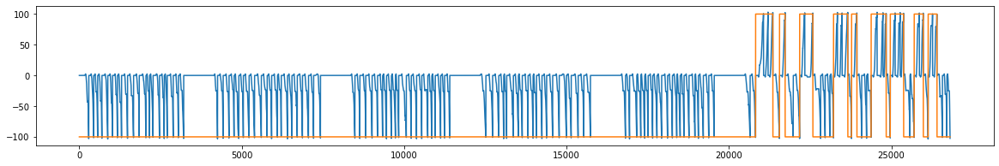

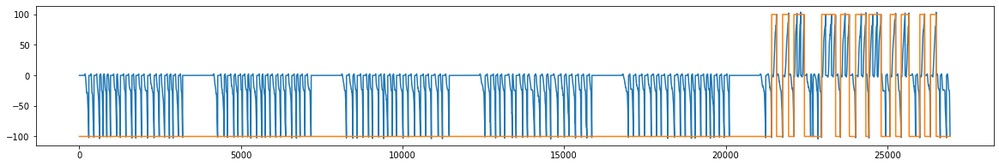

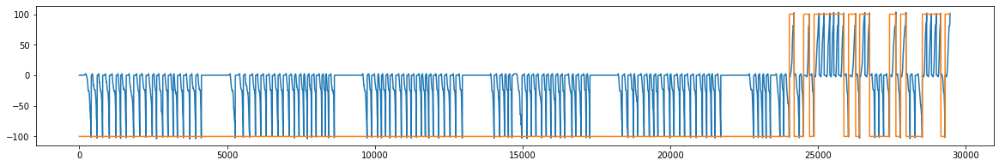

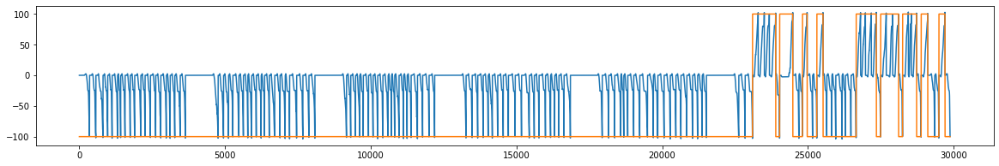

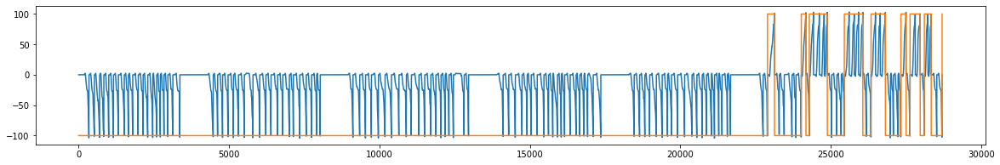

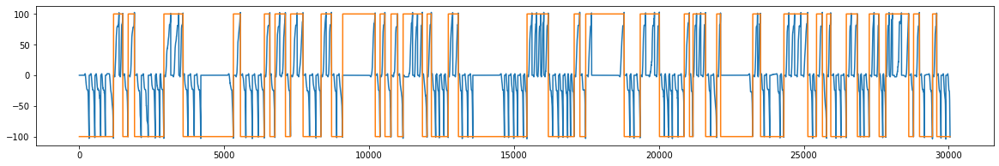

In [31]:
mouse = 'mCherry6'
sessions = stx.ymaze_sess_deets.CTRL_sessions[mouse]
pkldir = os.path.join('/home/mplitt/YMazeSessPkls/',mouse)
for ind, deets in enumerate(sessions[:6]):
    print(deets)
        
        
    sess = stx.session.YMazeSession.from_file(
                            os.path.join(pkldir, deets['date'], "%s_%d.pkl" % (deets['scene'], deets['session'])),
                            verbose=False)
    
    print(sess.novel_arm)
    print((sess.trial_info['LR']==sess.novel_arm).sum(), (sess.trial_info['LR']==-1*sess.novel_arm).sum())
    
    fig,ax = plt.subplots(figsize= [20,3])
    ax.plot(sess.vr_data['posx'])
    ax.plot(100*sess.vr_data['LR'])

{'date': '14_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 3, 'novel_arm': 1, 'ravel_ind': 0}
{'date': '15_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 3, 'novel_arm': 1, 'ravel_ind': 1}
{'date': '16_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 2, 'novel_arm': 1, 'ravel_ind': 2}
{'date': '17_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 2, 'novel_arm': 1, 'ravel_ind': 3}
{'date': '18_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 1, 'novel_arm': 1, 'ravel_ind': 4}
{'date': '19_10_2021', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 5, 'novel_arm': 1, 'ravel_ind': 5}


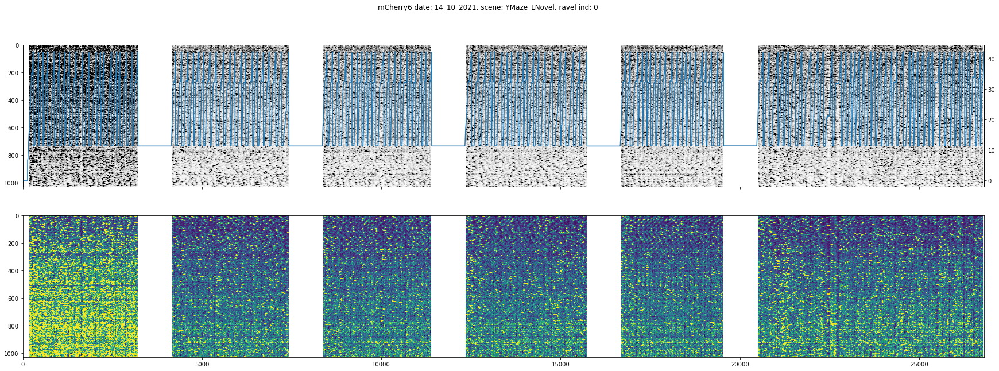

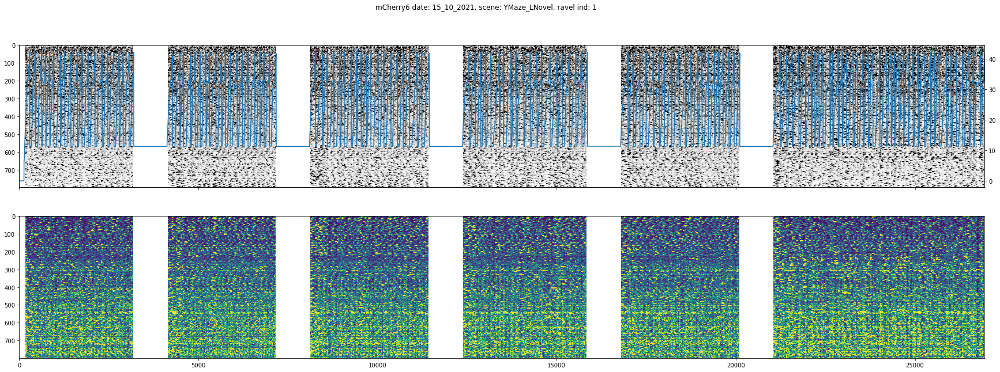

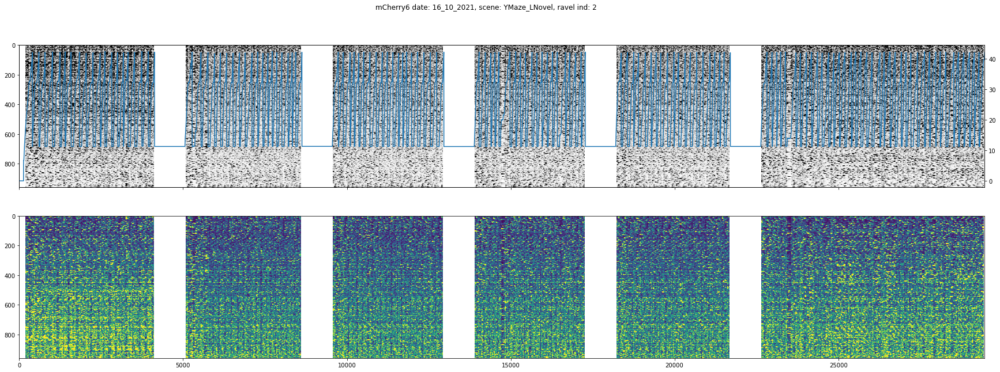

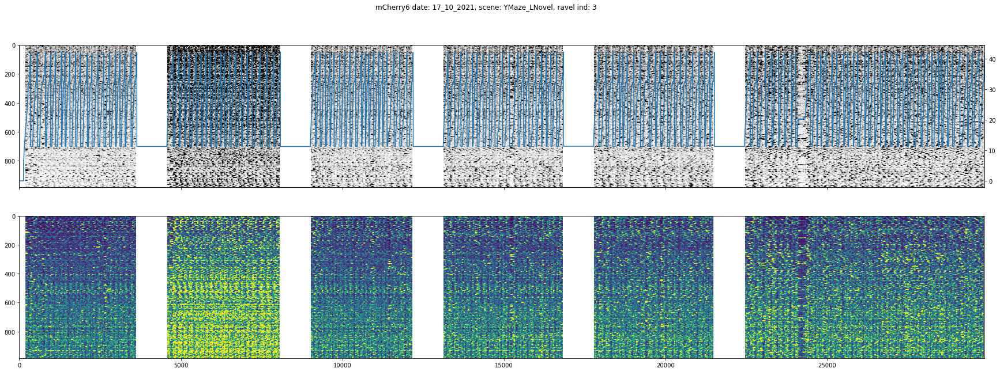

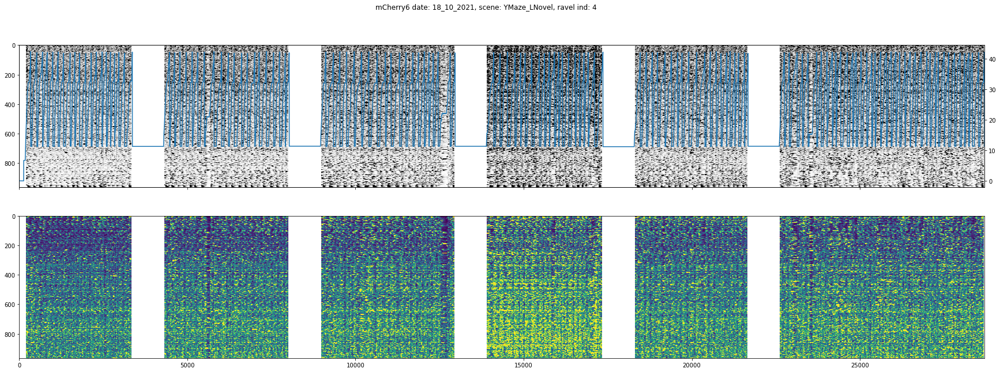

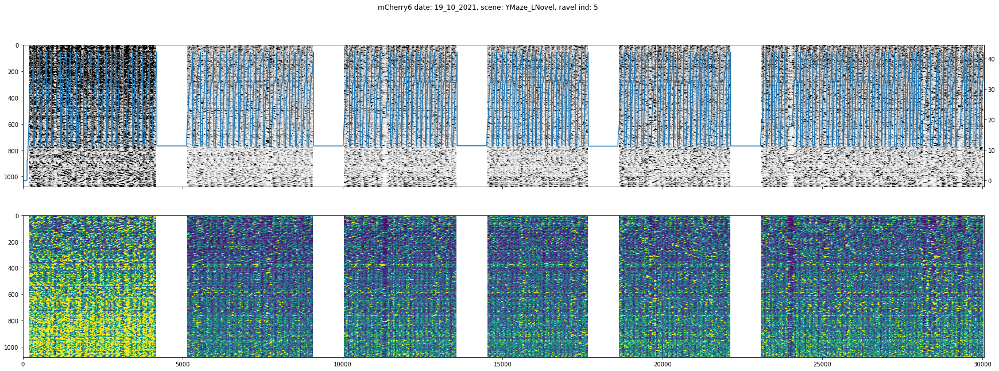

In [32]:
# for mouse, sessions in stx.ymaze_sess_deets.KO_sessions_ravel.items():
mouse = 'mCherry6'
# sessions = stx.ymaze_sess_deets.KO_sessions[mouse]
sessions = stx.ymaze_sess_deets.CTRL_sessions[mouse]
pkldir = os.path.join('/home/mplitt/YMazeSessPkls/',mouse)
for ind, deets in enumerate(sessions[:6]):
    print(deets)
        
        
    sess = stx.session.YMazeSession.from_file(
                            os.path.join(pkldir, deets['date'], "%s_%d.pkl" % (deets['scene'], deets['session'])),
                            verbose=False)

    fig,ax =  plt.subplots(2,1,figsize=[30,10], sharex=True)
   
    
    axx = ax[0].twinx()
    ax[0].imshow(sess.timeseries['F_dff_norm'][::-1,:],aspect = 'auto',vmin=0,vmax=.3,cmap='Greys',zorder=10)
    
    t = sess.vr_data['t']._values
    t[t<0]=np.nan
    axx.plot(t)
    
#     t[t<0]=0
#     ax[0].plot(t)
#     ax[0].scatter(sess.trial_start_inds,sess.vr_data['t'].iloc[sess.trial_start_inds],color='green')
#     ax[0].scatter(sess.teleport_inds,sess.vr_data['t'].iloc[sess.teleport_inds],color='red')
#     ax[0].plot(sess.timeseries['F_dff'][2,:])


    ax[1].imshow(sess.timeseries['F_dff_norm'],aspect = 'auto',vmin=0,vmax=.3)
    fig.suptitle("%s date: %s, scene: %s, ravel ind: %d" % (mouse, deets['date'], deets['scene'], ind))